# Integration with adult Pan-immune data - all HSC/Immune

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys,os
import scvi
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import scipy

In [3]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
## import utils
cwd = '.'
sys.path.append(cwd)

import map_query_utils

In [5]:
## r2py setup
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

anndata2ri.activate()

In [6]:
%load_ext rpy2.ipython


In [7]:
%%R
library(tidyverse)
library(reshape2)
library(patchwork)

remove_x_axis <- function(){
  theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), axis.title.x = element_blank())  
}

remove_y_axis <- function(){
  theme(axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.title.y = element_blank())  
}

In [1]:
def _plot_sorted_violin(merged_adata_bcells, groupby, y_value):
    n_cells_anno = merged_adata_bcells.obs[[groupby,y_value]].value_counts(groupby)
    keep_anno = n_cells_anno.index[n_cells_anno > 30]

    mean_sim = merged_adata_bcells.obs[[groupby,y_value]].groupby(groupby).mean()
    anno_order = mean_sim.loc[keep_anno].sort_values(y_value, ascending=False).index.tolist()

    merged_adata_bcells.var_names_make_unique()
    plt.rcParams["figure.figsize"] = [14,6]
    sc.pl.violin(merged_adata_bcells[merged_adata_bcells.obs[groupby].isin(keep_anno)], 
                                     y_value, groupby=groupby, rotation=90, 
                                     order=anno_order)

## Load data 

Initially provided by Cecilia, and re-saved by me to have EnsemblIDs as `var_names`

In [3]:
pi_adata = sc.read_h5ad('/nfs/team205/ed6/data/Fetal_immune/panimmune_query.h5ad')

#### Save variations

In [59]:
## Save consor a batch
pi_adata.obs["bbk"] = pi_adatidering each dona.obs["patient no"].copy()

## Exclude cells with missing batch

pi_adata.write_h5ad("/nfs/team205/ed6/data/Fetal_immune/panimmune_donorBatch_query.h5ad")
pi_adata.write_h5ad("/home/jovyan/mount/gdrive/Pan_fetal/data4gpu_node/panimmune_donorBatch_query.h5ad")

### Train on scVI models

On GPU node, running the call:

### Load scVI training outputs

In [8]:
query_h5ad_file = '/home/jovyan/mount/gdrive/Pan_fetal/data4gpu_node/panimmune_query.mapped2HSC_IMMUNE.h5ad'
split = "HSC_IMMUNE"
ref_data_dir = '/home/jovyan/mount/gdrive/Pan_fetal/data4gpu_node/'
timestamp = '20210429'

In [9]:
# merged_adata = map_query_utils.merge_query_and_reference(query_h5ad_file, split, ref_data_dir=ref_data_dir)

In [10]:
data_dir = "/nfs/team205/ed6/data/Fetal_immune/"

In [ ]:
merged_adata = sc.read_h5ad('/home/jovyan/mount/gdrive/Pan_fetal/data4gpu_node/panimmune_query.mapped2HSC_IMMUNE.withReference.h5ad')

In [706]:
## Filter maternal contaminants
mat_barcodes = pd.read_csv("~/Pan_fetal_immune/metadata/souporcell_results/maternal_barcodes.csv", index_col=0)
mat_barcodes = pd.Series([x.split("-1")[0] for x in mat_barcodes['x']])
reference_obs = merged_adata.obs_names[merged_adata.obs.dataset == "reference"]
exclude_obs = reference_obs[reference_obs.str.strip("-reference").isin(mat_barcodes)]

merged_adata = merged_adata[~merged_adata.obs_names.isin(exclude_obs)].copy()

In [13]:
## Load reference annotations
anno_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv", index_col=0)

reference_obs = merged_adata.obs_names[merged_adata.obs.dataset == "reference"]
merged_adata.obs["annotation_reference"] = np.nan
merged_adata.obs.loc[reference_obs, "annotation_reference"] = anno_obs.loc[reference_obs.str.strip("-reference")]["anno_lvl_2_final_clean"].values

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (6,21,22) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


NameError: name 'merged_adata' is not defined

... storing 'annotation_reference' as categorical


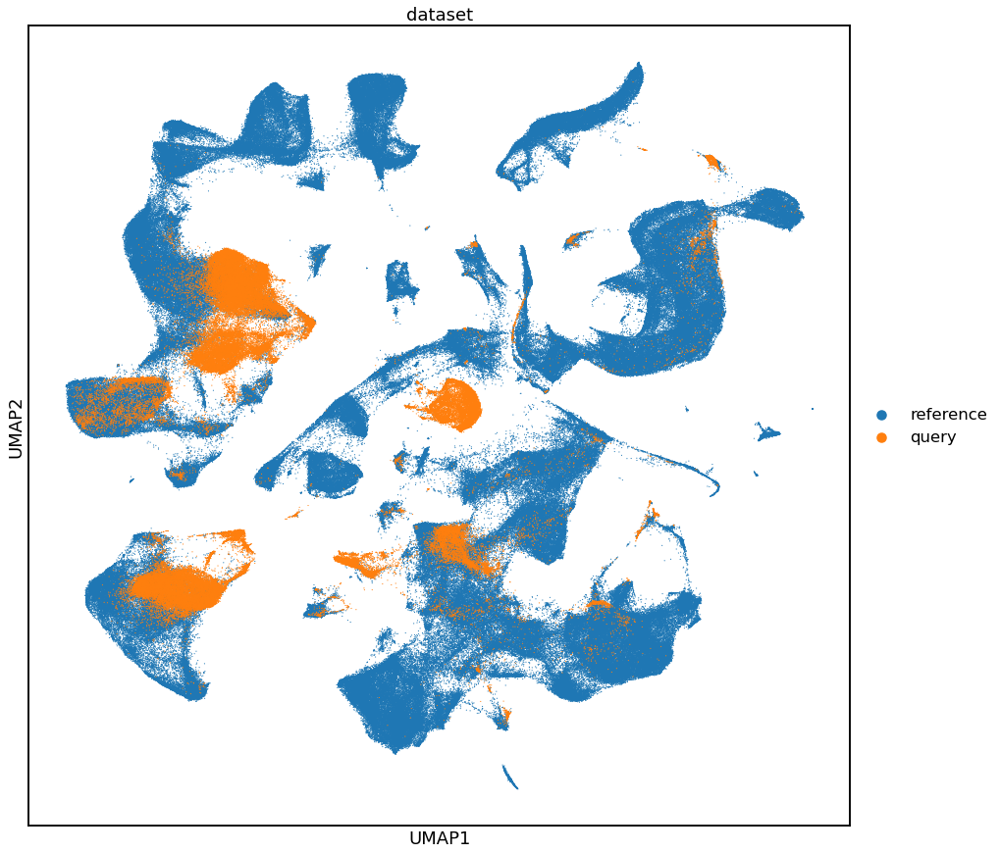

In [811]:
plt.rcParams["figure.figsize"] = [15,15]
sc.pl.umap(merged_adata, color=["dataset"], size=5)

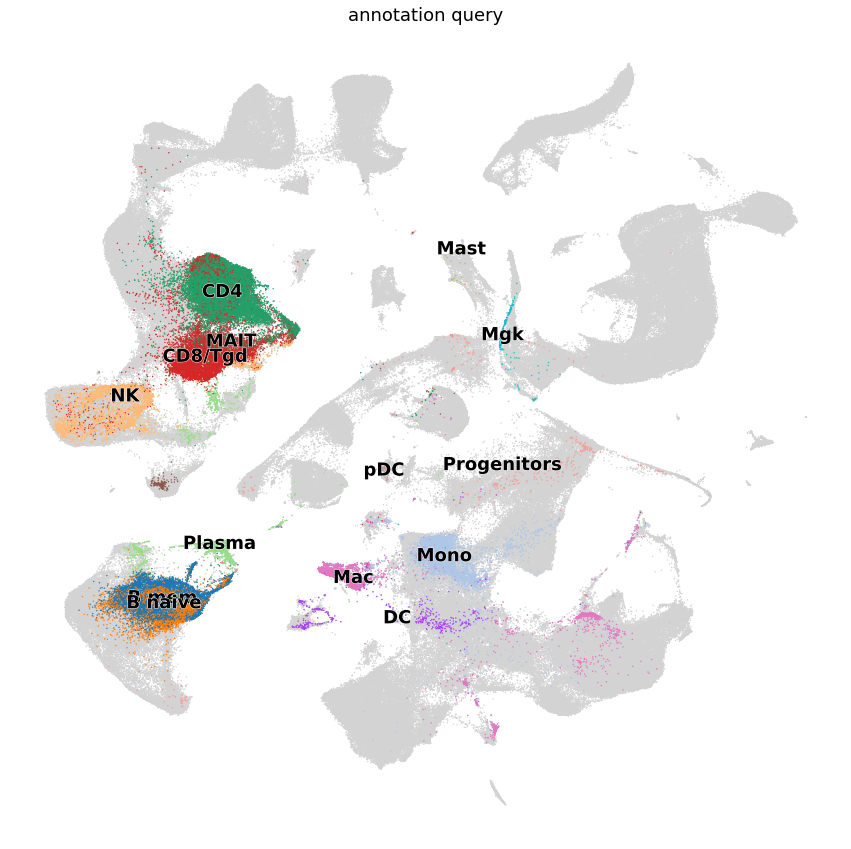

In [812]:
anno_labels = merged_adata.obs["anno"][merged_adata.obs["anno"]!="nan"].unique().tolist()
scv.pl.umap(merged_adata, color=["anno"], size=8, legend_loc="on data", groups=anno_labels, title="annotation query")

In [766]:
merged_adata.var_names = merged_adata.var["GeneName-reference"].values

In [768]:
sc.pp.normalize_per_cell(merged_adata, counts_per_cell_after=10e4)
sc.pp.log1p(merged_adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


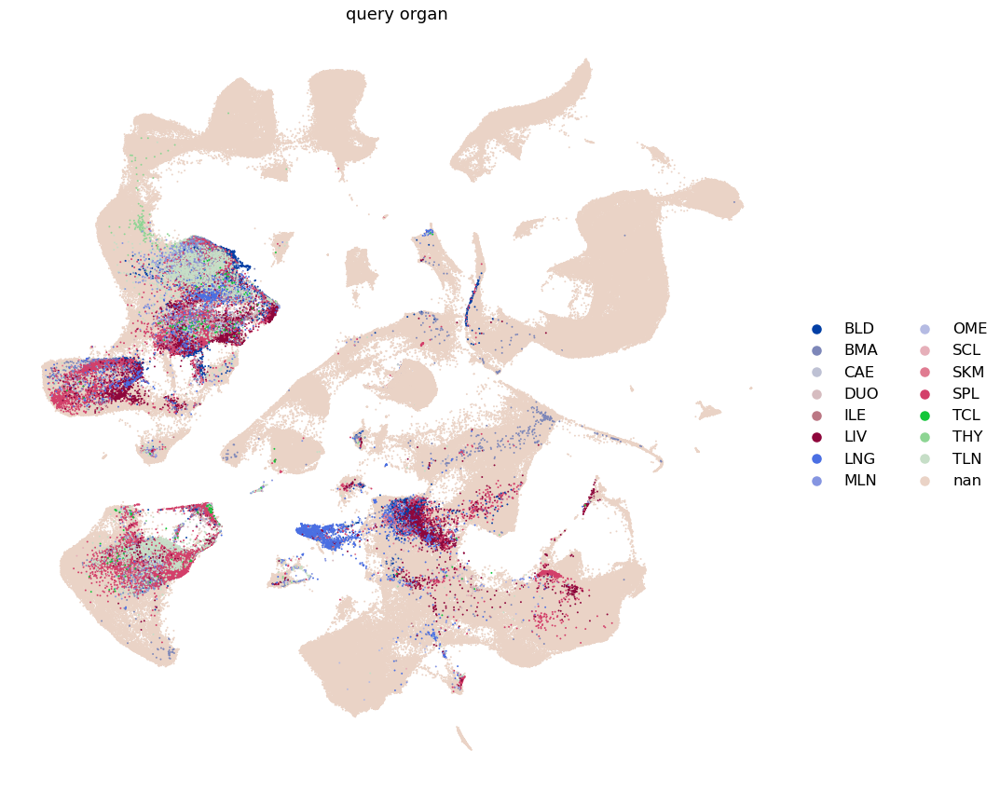

In [784]:
plt.rcParams["figure.figsize"] = [15,15]
scv.pl.umap(merged_adata, color=["organ code"], size=15, legend_loc="right margin", title="query organ")

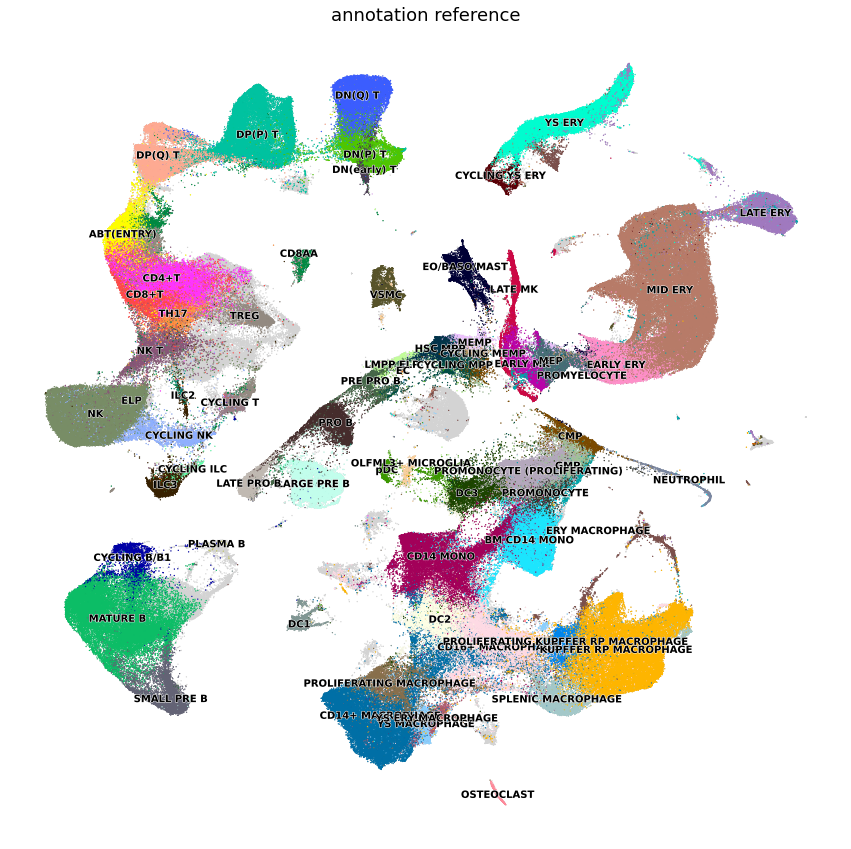

In [813]:
anno_labels = merged_adata.obs["annotation_reference"][merged_adata.obs["annotation_reference"]!="nan"].unique().tolist()
anno_labels = [x for x in anno_labels if type(x)==str]

lowQ_labels = [x for x in anno_labels if "DOUBLET" in x]
lowQ_labels.extend([x for x in anno_labels if "HIGH_MITO" in x])
lowQ_labels.extend([x for x in anno_labels if "LOW_Q" in x])
lowQ_labels.extend([x for x in anno_labels if "CONTAMINANTS" in x])

anno_labels = [x for x in anno_labels if x not in lowQ_labels]

scv.pl.umap(merged_adata, color=["annotation_reference"], size=7, legend_loc="on data", groups=anno_labels, 
            legend_fontsize=10,
            title="annotation reference")

In [821]:
merged_adata.obs["predicted_anno"] = None

In [822]:
map_query_utils.predict_label(merged_adata, anno_col="annotation_reference")

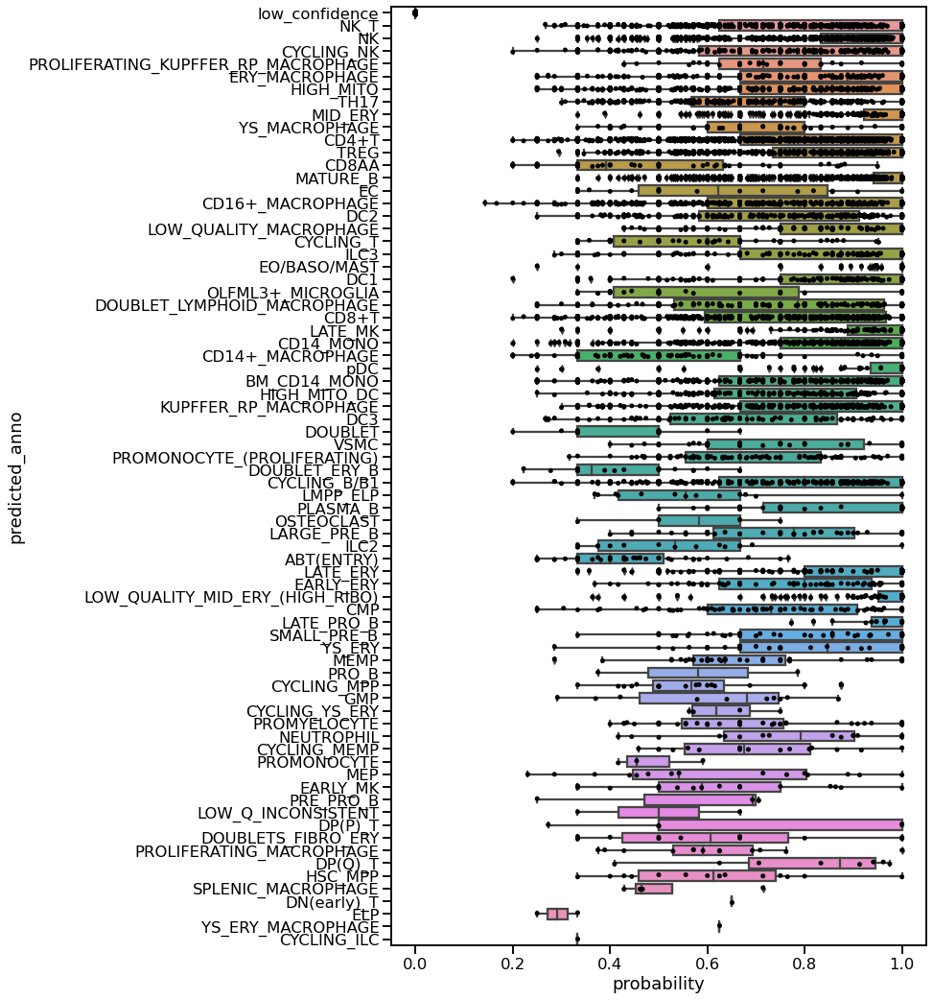

In [823]:
plt.rcParams["figure.figsize"] = [10,18]
map_query_utils.plot_predicted_anno_probability(merged_adata)

In [ ]:
# sc.pl.violin(merged_adata[merged_adata.obs["predicted_anno"] == "CYCLING_B/B1"], "predicted_anno_prob",groupby="anno_B_v2")

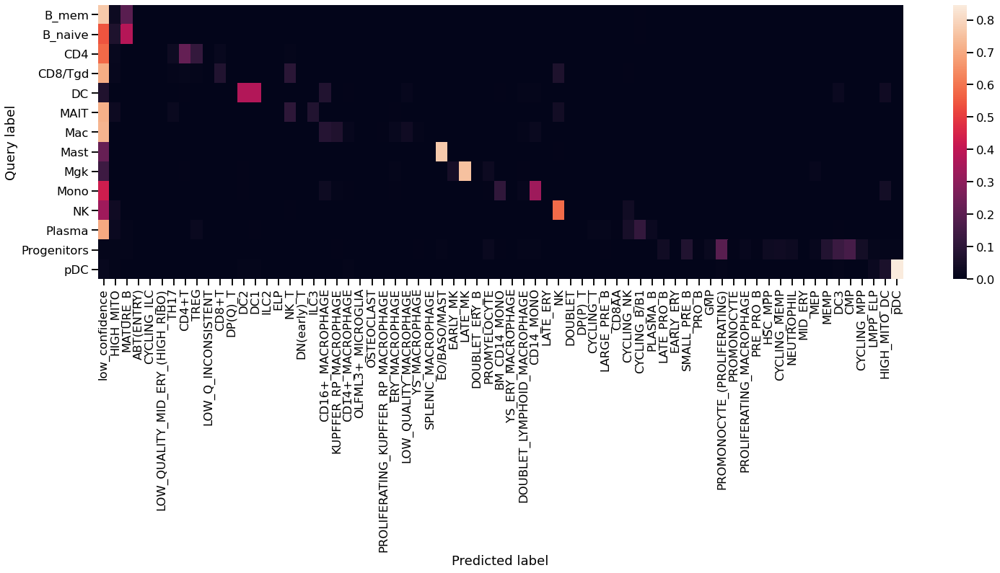

In [827]:
sns.set_context("talk")
query_anno_col="anno"

query_obs = merged_adata.obs_names[merged_adata.obs.dataset == "query"]
empty_query = query_obs[merged_adata[query_obs].obs[query_anno_col]=="nan"]
merged_adata_clean = merged_adata[~merged_adata.obs_names.isin(empty_query)]

plt.rcParams["figure.figsize"] = [25,7]
map_query_utils.plot_confusion_mat(merged_adata_clean, query_anno_col=query_anno_col, show_low_confidence=True)

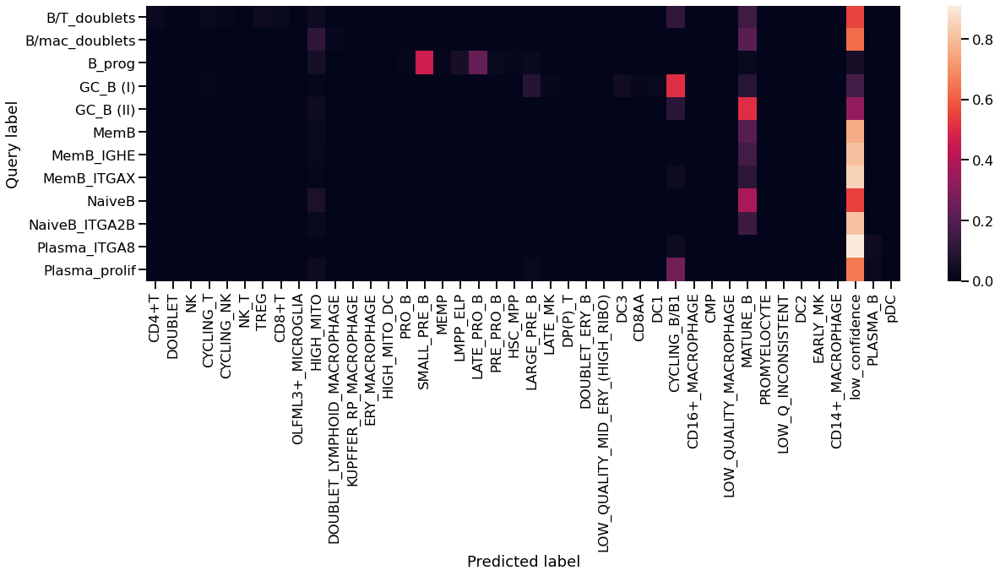

In [834]:
query_anno_col="anno_B_v2"

query_obs = merged_adata.obs_names[merged_adata.obs.dataset == "query"]
empty_query = query_obs[merged_adata[query_obs].obs[query_anno_col]=="nan"]
merged_adata_clean = merged_adata[~merged_adata.obs_names.isin(empty_query)]

plt.rcParams["figure.figsize"] = [20,6]
map_query_utils.plot_confusion_mat(merged_adata_clean, query_anno_col=query_anno_col, show_low_confidence=True)

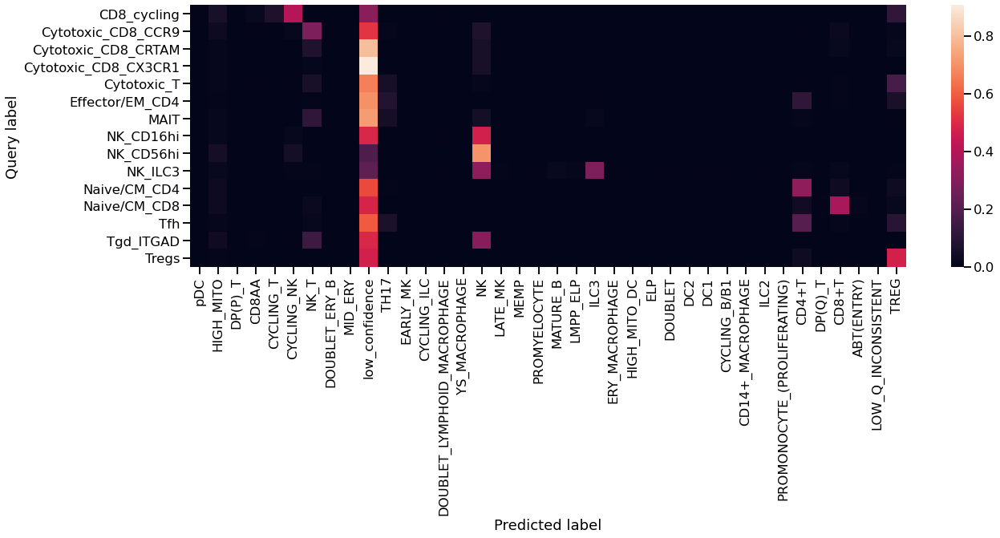

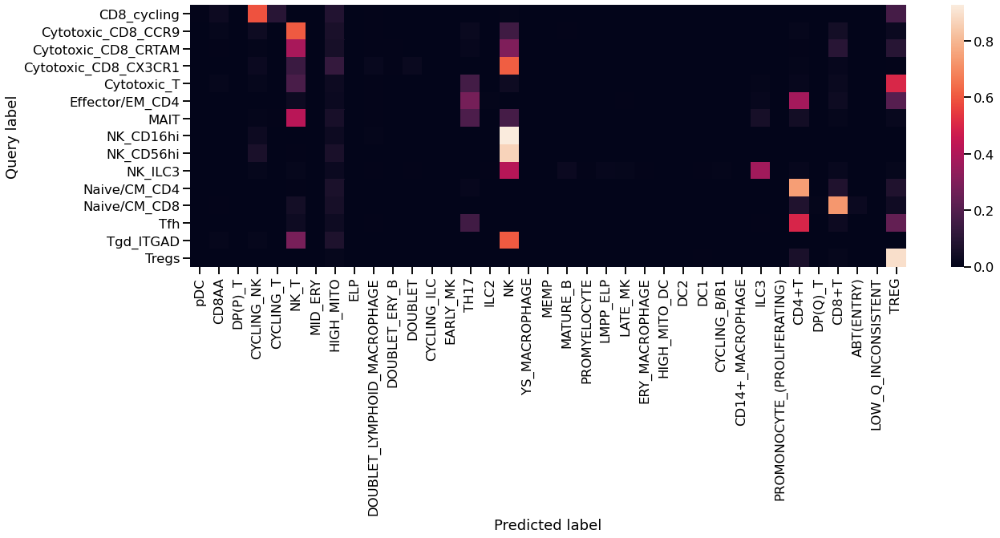

In [835]:
query_anno_col="anno_T_2"

query_obs = merged_adata.obs_names[merged_adata.obs.dataset == "query"]
empty_query = query_obs[merged_adata[query_obs].obs[query_anno_col] == 'nan']
merged_adata_clean = merged_adata[~merged_adata.obs_names.isin(empty_query)]

plt.rcParams["figure.figsize"] = [20,6]
map_query_utils.plot_confusion_mat(merged_adata_clean, query_anno_col=query_anno_col, show_low_confidence=True)
plt.show()
map_query_utils.plot_confusion_mat(merged_adata_clean, query_anno_col=query_anno_col, show_low_confidence=False)

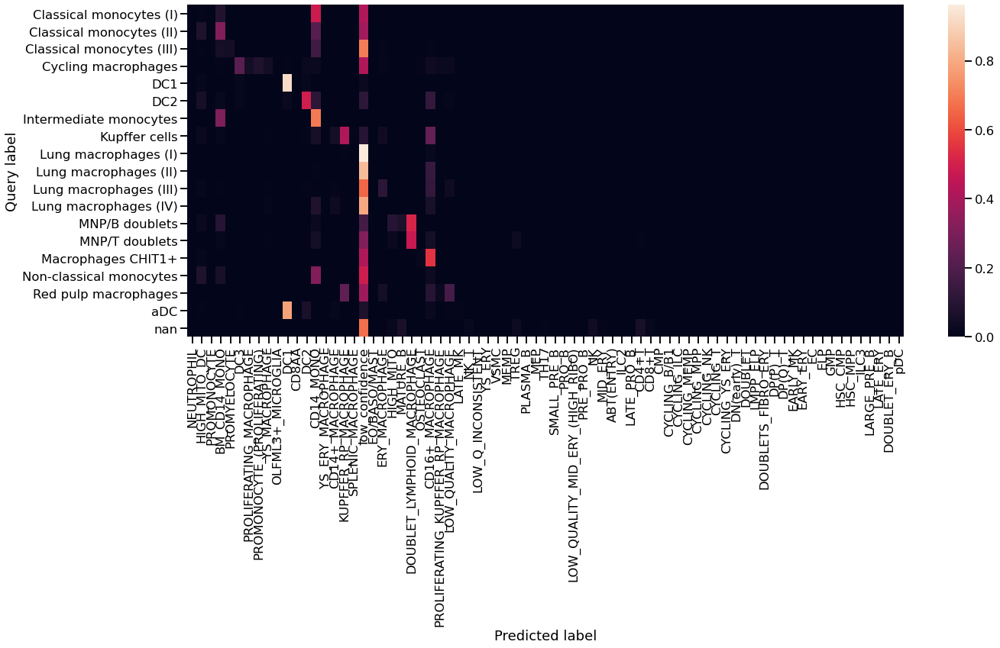

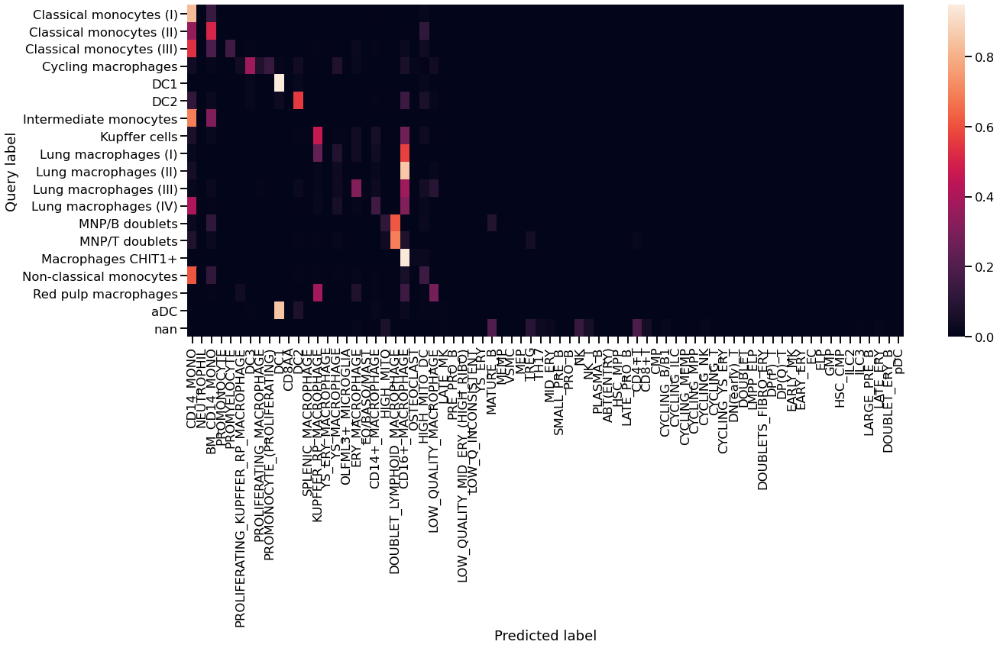

In [780]:
query_anno_col="anno_mye"

query_obs = merged_adata.obs_names[merged_adata.obs.dataset == "query"]
empty_query = query_obs[merged_adata[query_obs].obs[query_anno_col].isna()]
merged_adata_clean = merged_adata[~merged_adata.obs_names.isin(empty_query)]

plt.rcParams["figure.figsize"] = [21,8]
map_query_utils.plot_confusion_mat(merged_adata_clean, query_anno_col=query_anno_col, show_low_confidence=True)
plt.show()
map_query_utils.plot_confusion_mat(merged_adata_clean, query_anno_col=query_anno_col, show_low_confidence=False)

In [787]:
merged_adata.var_names_make_unique()

... storing 'annotation_reference' as categorical
... storing 'predicted_anno' as categorical


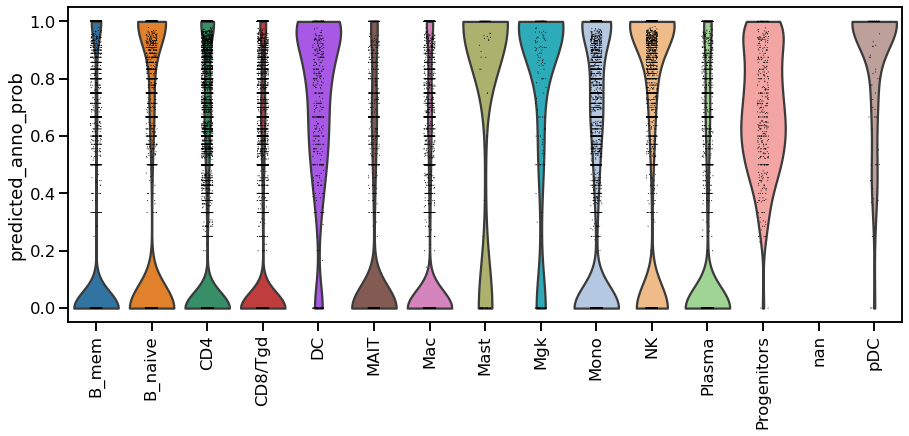

In [843]:
query_anno_col="anno"

query_obs = merged_adata.obs_names[merged_adata.obs.dataset == "query"]
empty_query = query_obs[merged_adata[query_obs].obs[query_anno_col]=="nan"]
merged_adata_clean = merged_adata[~merged_adata.obs_names.isin(empty_query)].copy()
merged_adata_clean.var_names_make_unique()

plt.rcParams["figure.figsize"] = [12,6]
sc.pl.violin(merged_adata_clean, "predicted_anno_prob", groupby=query_anno_col, rotation=90, size=1);

---

### Quantify matching between fetal and adult

In [791]:
def _find_MNNs(merged_adata_bcells, k=30, n_jobs=5):
    '''
    Find mutual nearest neighbors between query and reference data
    '''
    from scipy.spatial import cKDTree
    
    ## Extract embedding
    X_emb = merged_adata_bcells.obsm["X_scvi"].copy()

    is_query = merged_adata_bcells.obs["dataset"] == "query"
    is_reference = merged_adata_bcells.obs["dataset"] == "reference"

    X_emb_ref = X_emb[is_reference,:]
    X_emb_que = X_emb[is_query,:]
    
    ## Find mutual nearest neighbors pairs
    # ## Borrowed from chriscainx/mnnpy
    k1=k2=k
    data_query = X_emb_que
    data_ref = X_emb_ref
    k_index_ref = cKDTree(data_ref).query(x=data_query, k=k1, n_jobs=n_jobs)[1]

    ## Subset to reference cells that have some nn
    ref_w_nn = np.unique(k_index_ref.flatten())
    k_index_query = cKDTree(data_query).query(x=data_ref[ref_w_nn,:], k=k2, n_jobs=n_jobs)[1]
    mutual_ref = []
    mutual_query = []
    for index_ref in range(len(ref_w_nn)):
        for index_query in k_index_query[index_ref]:
            if ref_w_nn[index_ref] in k_index_ref[index_query]:
                mutual_ref.append(ref_w_nn[index_ref])
                mutual_query.append(index_query)

    ## from mnn_pairs to graph
    mnn_graph = scipy.sparse.csr_matrix((sum(is_query), sum(is_reference)))

    for i in range(len(mutual_query)):
        mnn_graph[mutual_query[i],mutual_ref[i]] = 1
        
    return(mnn_graph)

In [ ]:
def _scArches_adjusted_dist(dist_nns):
    # compute standard deviation
    std_d = np.sqrt(sum(np.sqrt(dist_nns))/dist_nns.shape[0])
    # apply gaussian kernel
    adj_dist_nns = np.exp(-dist_nns/np.square(2/std_d))
    return(adj_dist_nns)

In [ ]:
def _MNN_to_KNN_similarity_ratio(merged_adata_bcells, mnn_graph):
    ## Extract embedding
    X_emb = merged_adata_bcells.obsm["X_scvi"].copy()

    is_query = merged_adata_bcells.obs["dataset"] == "query"
    is_reference = merged_adata_bcells.obs["dataset"] == "reference"

    X_emb_ref = X_emb[is_reference,:]
    X_emb_que = X_emb[is_query,:]

    ## Mean similarity between mutual nearest neighbors
    mnn_dists = mnn_graph.copy()
    has_mnn = np.array(mnn_graph.sum(0))[0] > 0

    dists = scipy.spatial.distance.cdist(X_emb[is_query,:], X_emb[is_reference,:][has_mnn,:], metric="euclidean")

    has_mnn_nz = mnn_dists[:,has_mnn].nonzero()
    nz = mnn_dists.nonzero()
    mnn_dists[nz] = dists[has_mnn_nz]

    ## Convert to array of MNN distances
    mnn_dists_reference = np.zeros(shape=(mnn_dists.shape[1], k))
    mnn_dists_T = mnn_dists.T
    has_mnn_ixs = np.where(np.array(mnn_dists_T.sum(1)).ravel() > 0)[0]
    for i in has_mnn_ixs:
        ds = np.array(mnn_dists_T[i,:][mnn_dists_T[i,:].nonzero()])
        mnn_dists_reference[i,0:ds.shape[1]] = ds.copy()

    mnn_dists_query = np.zeros(shape=(mnn_dists.shape[0], k))
    for i in range(mnn_dists_query.shape[0]):
        if mnn_dists[i,:].nonzero()[0].shape[0] > 0:
            ds = np.array(mnn_dists[i,:][mnn_dists[i,:].nonzero()])
            mnn_dists_query[i,0:ds.shape[1]] = ds.copy()

    ## Adjust distances as in scArches paper
    adj_mnn_dists_reference = mnn_dists_reference.copy()
    for i in range(len(mnn_dists_reference)):
        if adj_mnn_dists_reference[i,mnn_dists_reference[i] > 0].shape[0] > 0:
            adj_mnn_dists_reference[i,mnn_dists_reference[i] > 0] = _scArches_adjusted_dist(mnn_dists_reference[i, mnn_dists_reference[i] > 0])

    adj_mnn_dists_query = mnn_dists_query.copy()
    for i in range(len(mnn_dists_query)):
        if adj_mnn_dists_query[i,mnn_dists_query[i] > 0].shape[0] > 0:
            adj_mnn_dists_query[i,mnn_dists_query[i] > 0] = _scArches_adjusted_dist(mnn_dists_query[i, mnn_dists_query[i] > 0])


    mean_mnn_sim_reference = adj_mnn_dists_reference.mean(1)
    mean_mnn_sim_query = adj_mnn_dists_query.mean(1)

    ## Compute distances between nearest neighbors
    from pynndescent import NNDescent
    knns = NNDescent(X_emb, metric="euclidean").query(X_emb, k=30)
    knn_dists = knns[1][:,1:]

    adj_knn_dists = knn_dists.copy()
    for i in range(len(knn_dists)):
        adj_knn_dists[i] = _scArches_adjusted_dist(knn_dists[i])

    ## Mean similarity between nearest neighbors
    mean_knn_sim_reference = adj_knn_dists[is_reference].mean(1)
    mean_knn_sim_query = adj_knn_dists[is_query].mean(1)

    mnn_sim_ratio_reference = mean_mnn_sim_reference/mean_knn_sim_reference
    mnn_sim_ratio_query = mean_mnn_sim_query/mean_knn_sim_query
    
    ## Save everything in adata
    merged_adata_bcells.obs['knn_sim'] = 0
    merged_adata_bcells.obs.loc[is_reference,'knn_sim'] = mean_knn_sim_reference
    merged_adata_bcells.obs.loc[is_query,'knn_sim'] = mean_knn_sim_query
    
    merged_adata_bcells.obs['mnn_sim'] = 0
    merged_adata_bcells.obs.loc[is_reference,'mnn_sim'] = mean_mnn_sim_reference
    merged_adata_bcells.obs.loc[is_query,'mnn_sim'] = mean_mnn_sim_query
    
    merged_adata_bcells.obs['mnn_sim_ratio'] = 0
    merged_adata_bcells.obs.loc[is_reference,'mnn_sim_ratio'] = mnn_sim_ratio_reference
    merged_adata_bcells.obs.loc[is_query,'mnn_sim_ratio'] = mnn_sim_ratio_query

In [ ]:
mnn_graph = _find_MNNs(merged_adata, k=30, n_jobs=7)

In [ ]:
merged_adata

In [ ]:
_MNN_to_KNN_similarity_ratio(merged_adata, mnn_graph)

## Mapping to B cells 
For B1 analysis

In [58]:
## Filter and save B cells (for B1 specific analysis)
b_pi_adata = pi_adata[~pi_adata.obs["anno_B_v2"].isna()]

b_pi_adata.write_h5ad("/nfs/team205/ed6/data/Fetal_immune/panimmune_Bcells_query.h5ad")
b_pi_adata.write_h5ad("/home/jovyan/mount/gdrive/Pan_fetal/data4gpu_node/panimmune_Bcells_query.h5ad")

Save LYMPHOID model with EnsemblIDs

In [29]:
split = "LYMPHOID"
scvi_outs_dir = '/home/jovyan/mount/gdrive/Pan_fetal/data4gpu_node/'

## Read old varnames
model_dir='scvi_' + split + '_model/'
var_names_model = pd.read_csv(scvi_outs_dir + model_dir + "var_names.csv", header=None)[0].values

## Make new model folder for model with EnsemblIDs
new_model_dir = model_dir.strip("/") +"_ENSID/"
bash_call = 'cp -r {o} {n}'.format(o=scvi_outs_dir + model_dir, n=scvi_outs_dir+new_model_dir)
os.system(bash_call)

## Save var_names
adata_ref_var = pd.read_csv(scvi_outs_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.var.csv'.format(t=timestamp, s=split), index_col=0)
adata_ref_var.iloc[var_names_model]['GeneID'].to_csv(scvi_outs_dir + new_model_dir + "var_names.csv", header=None, index=False)

In [83]:
query_h5ad_file = '/home/jovyan/mount/gdrive/Pan_fetal/data4gpu_node/panimmune_Bcells_query.mapped2LYMPHOID.h5ad'
split = "LYMPHOID"
ref_data_dir = '/home/jovyan/mount/gdrive/Pan_fetal/data4gpu_node/'
timestamp = '20210429'

In [ ]:
merged_adata_bcells = map_query_utils._merge_query_and_reference(query_h5ad_file, split, ref_data_dir=ref_data_dir)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [455]:
anndata.concat([merged_adata_bcells[0:100], query_adata_full[0:142]], axis=1, join="outer", merge="unique", uns_merge="unique")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 242 × 100926
    obs: 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'bbk', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'dataset', 'knn_sim', 'mnn_sim', 'mnn_sim_ratio', 'sample', 'Source ID', 'sex', 'patient no', 'organ code', 'sample ID', 'fraction_mito', 'n_genes', 'n_counts', 'log_counts', 'batch', 'empty', 'bonf_pval', 'is_doublet', 'scrublet_score', 'louvain', 'louvain_R', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'leiden5', 'leiden10', 'leiden15', 'leiden20', 'cx1_anno', 'leiden_majority_anno', 'leiden1.5', 'anno', 'anno_mye', 'anno_T_2', 'anno_B_v2'
    var: 'GeneID', 'GeneName', 'gene_ids', 'feature_types', 'gene_names'
    uns: '_scvi'
    obsm: 'X_scvi'

In [15]:
## add reference annotation
reference_obs = merged_adata_bcells.obs_names[merged_adata_bcells.obs.dataset == "reference"]
merged_adata_bcells.obs["annotation_reference"] = np.nan
merged_adata_bcells.obs.loc[reference_obs[reference_obs.str.strip("-reference").isin(anno_obs.index)], "annotation_reference"] = anno_obs.loc[reference_obs.str.strip("-reference")[reference_obs.str.strip("-reference").isin(anno_obs.index)]]["anno_lvl_2_final_clean"].values

In [16]:
merged_adata_bcells.obs["predicted_anno"] = None
map_query_utils.predict_label(merged_adata_bcells, anno_col="annotation_reference")

/nfs/team205/ed6/bin/Pan_fetal_immune/src/8_align_query/map_query_utils.py:148: RuntimeWarning: invalid value encountered in true_divide
  new_anno_prob = new_anno.T/n_neighbors_ref


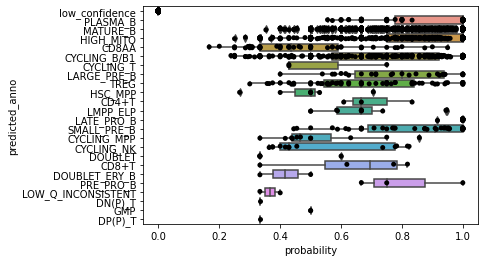

In [17]:
map_query_utils.plot_predicted_anno_probability(merged_adata_bcells)

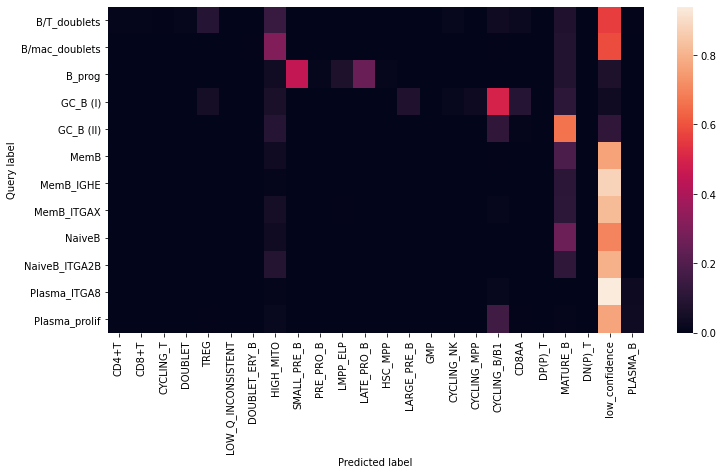

In [18]:
query_anno_col="anno_B_v2"

query_obs = merged_adata_bcells.obs_names[merged_adata_bcells.obs.dataset == "query"]
empty_query = query_obs[merged_adata_bcells[query_obs].obs[query_anno_col].isna()]
merged_adata_clean = merged_adata_bcells[~merged_adata_bcells.obs_names.isin(empty_query)]

plt.rcParams["figure.figsize"] = [12,6]
map_query_utils.plot_confusion_mat(merged_adata_clean, query_anno_col=query_anno_col, show_low_confidence=True)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


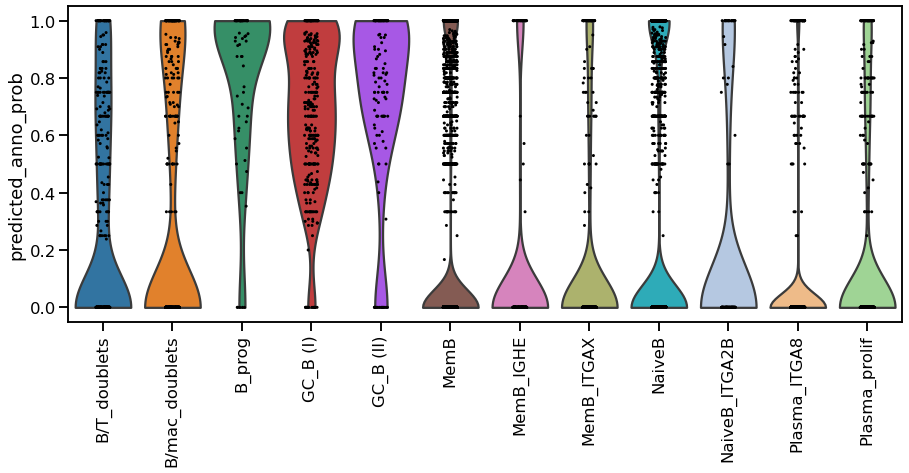

In [407]:
query_anno_col="anno_B_v2"

query_obs = merged_adata_bcells.obs_names[merged_adata_bcells.obs.dataset == "query"]
empty_query = query_obs[merged_adata_bcells[query_obs].obs[query_anno_col].isna()]
merged_adata_clean = merged_adata_bcells[~merged_adata_bcells.obs_names.isin(empty_query)].copy()
merged_adata_clean.var_names_make_unique()

sc.pl.violin(merged_adata_clean, "predicted_anno_prob", groupby=query_anno_col, rotation=90, size=3)

Visualize on UMAP with reference

In [50]:
sc.tl.umap(merged_adata_bcells, min_dist = 0.01, spread = 2)

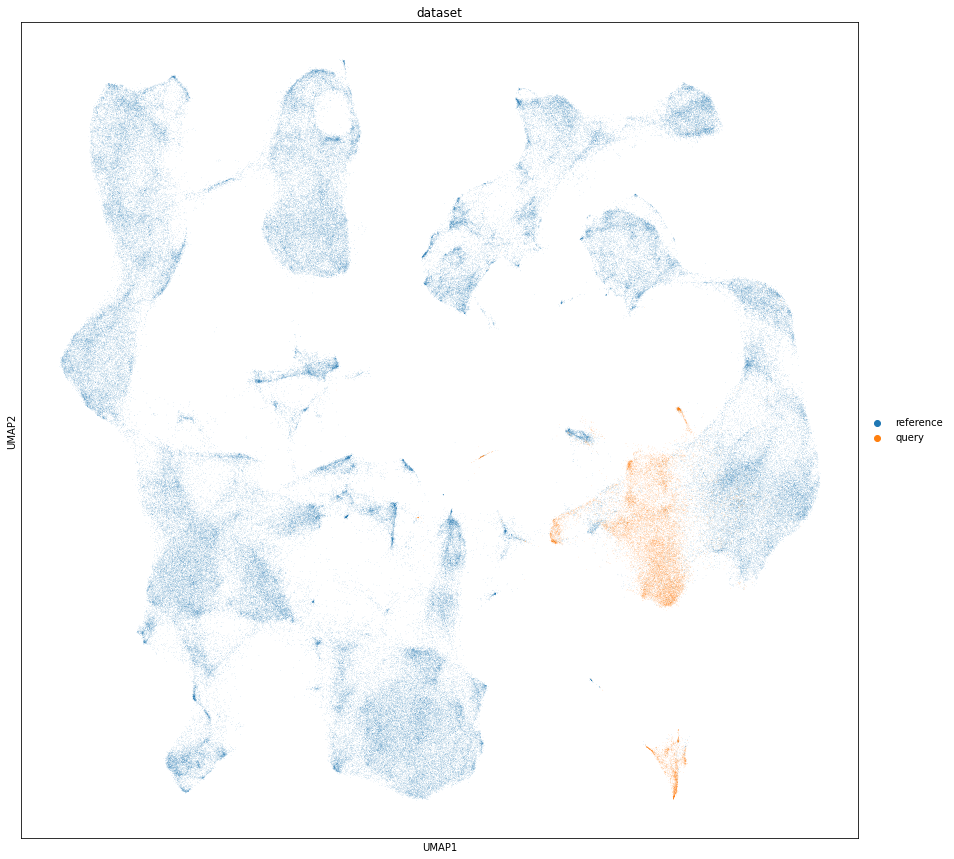

In [52]:
plt.rcParams["figure.figsize"] = [15,15]
sc.pl.umap(merged_adata_bcells, color="dataset")

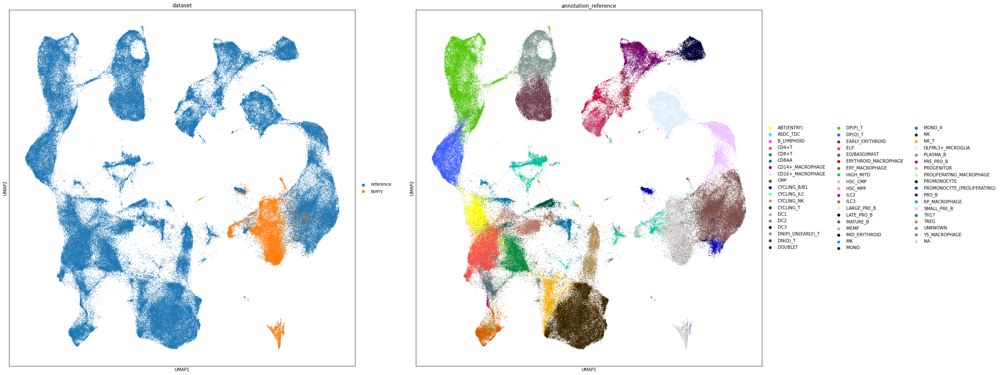

In [53]:
sc.pl.umap(merged_adata_bcells, color=["dataset","annotation_reference"], size=5)

In [160]:
import scvelo as scv

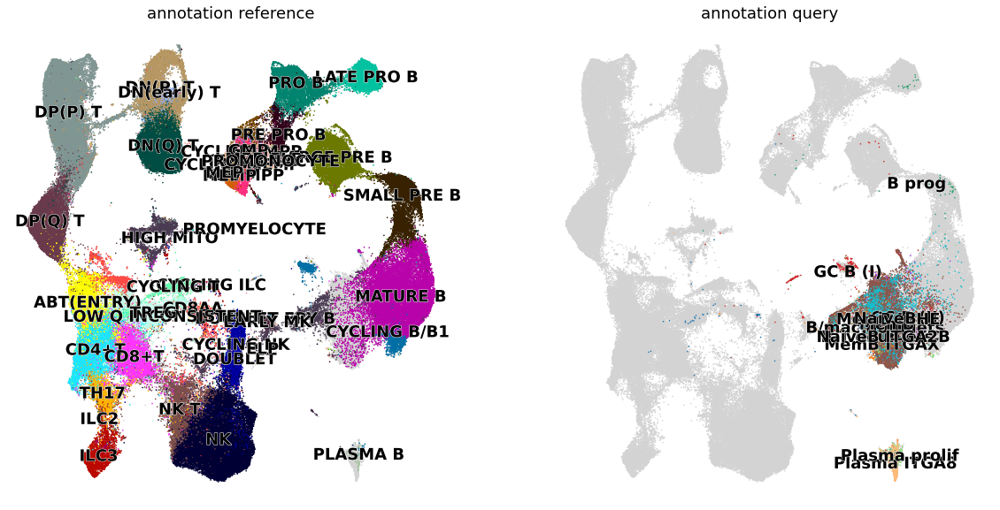

In [857]:
sns.set_context("talk")
plt.rcParams["figure.figsize"] = [10,10]
scv.pl.umap(merged_adata_bcells, color=["annotation_reference", "anno_B_v2"], size=10, legend_loc="on data", title=["annotation_reference", "annotation_query"])

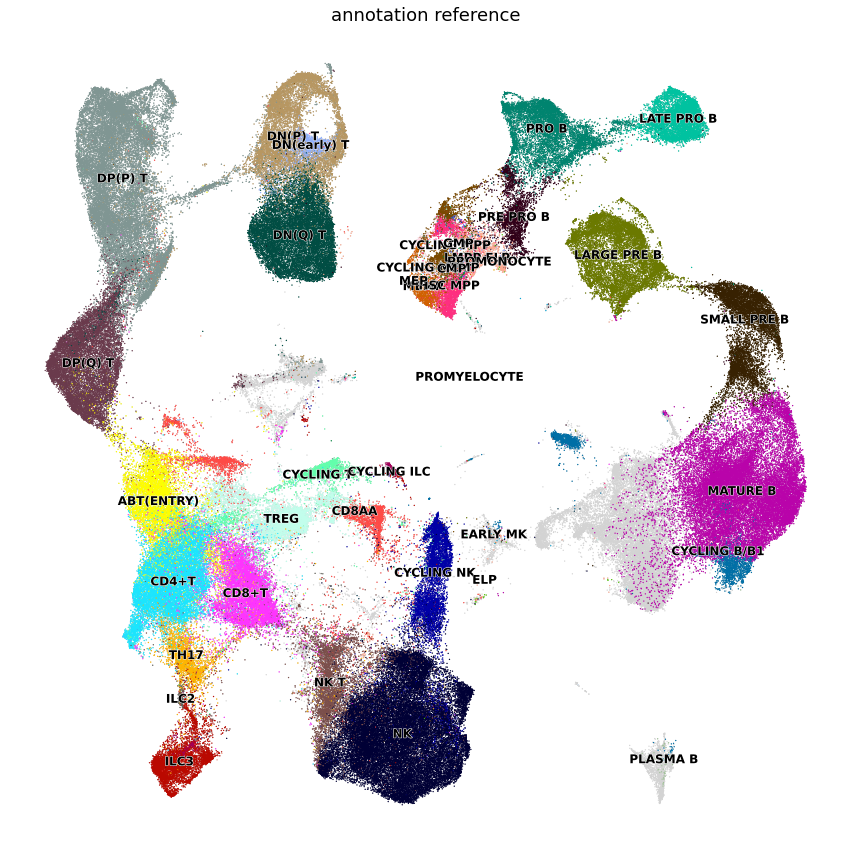

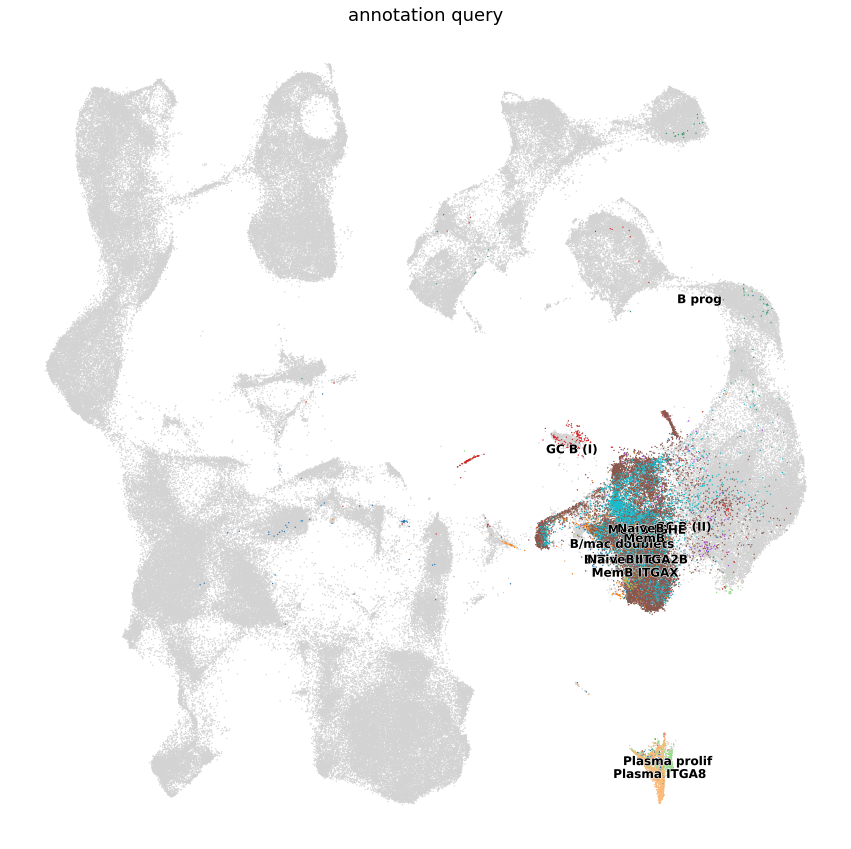

In [861]:
plt.rcParams["figure.figsize"] = [15,15]
anno_labels = merged_adata_bcells.obs["annotation_reference"][merged_adata_bcells.obs["annotation_reference"]!="nan"].unique().tolist()
anno_labels = [x for x in anno_labels if type(x)==str]

lowQ_labels = [x for x in anno_labels if "DOUBLET" in x]
lowQ_labels.extend([x for x in anno_labels if "HIGH_MITO" in x])
lowQ_labels.extend([x for x in anno_labels if "LOW_Q" in x])
lowQ_labels.extend([x for x in anno_labels if "CONTAMINANTS" in x])

anno_labels = [x for x in anno_labels if x not in lowQ_labels]

scv.pl.umap(merged_adata_bcells, color=["annotation_reference"], size=7, legend_loc="on data", groups=anno_labels, 
            legend_fontsize=12,
            title="annotation reference")

scv.pl.umap(merged_adata_bcells, color=["anno_B_v2"], size=7, legend_loc="on data", 
            legend_fontsize=12,
            title="annotation query")

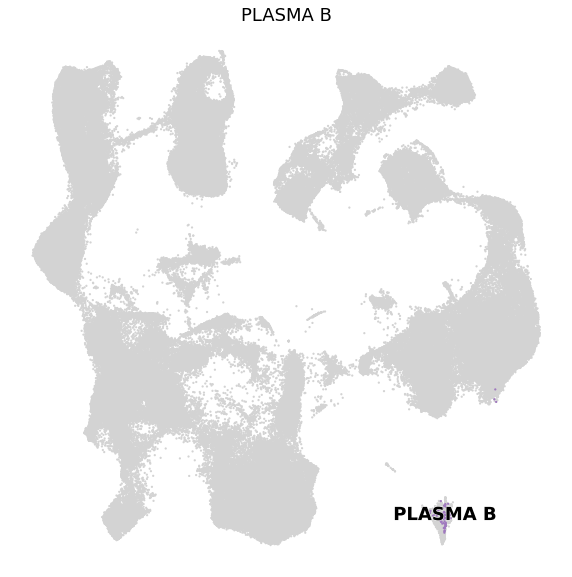

In [173]:
plt.rcParams["figure.figsize"] = [10,10]
scv.pl.umap(merged_adata_bcells, color=["annotation_reference"], size=20, legend_loc="on data", groups=["PLASMA_B"])

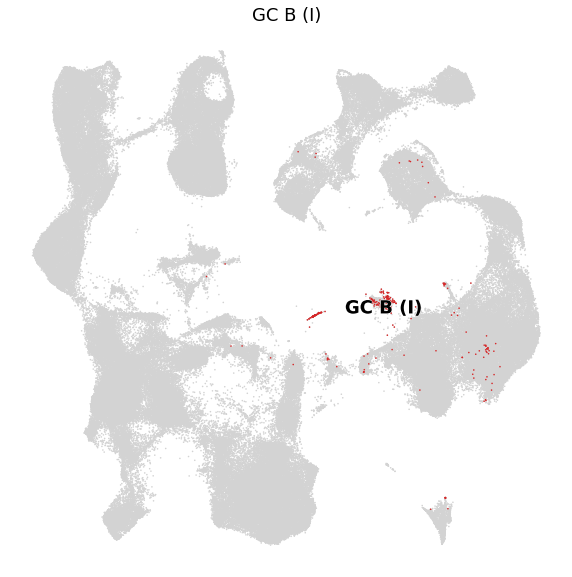

In [171]:
scv.pl.umap(merged_adata_bcells, color=["anno_B_v2"], size=10, legend_loc="on data", groups=["GC_B (I)"])

In [ ]:
scv.pl.umap(merged_adata_bcells, color=["anno_B_v2"], size=10, legend_loc="on data", groups=["GC_B (II)"])

In [148]:
sc.pp.normalize_per_cell(merged_adata_bcells)
sc.pp.log1p(merged_adata_bcells)

In [154]:
## Reconvert from gene IDs to names
merged_adata_bcells.var_names = merged_adata_bcells.var["GeneName-reference"].values

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:891: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['TNMD', 'FGR', 'CD99', 'HS3ST1', 'AOC1']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


In [27]:
gene_name = ['FCER2', "CD5", "CD27","MKI67", "IGHE", "AICDA"]
# gene_oi = merged_adata_bcells.var_names[merged_adata_bcells.var["GeneName-reference"].isin(gene_name)].tolist()

sc.pl.umap(merged_adata_bcells, color=gene_name, size=10, legend_loc="on data", ncols=2, cmap="Reds")

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'sample' as categorical
... storing 'Source ID' as categorical
... storing 'sex' as categorical
... storing 'patient no' as categorical
... storing 'organ code' as categorical
... storing 'sample ID' as categorical
... storing 'batch' as categorical
... storing 'empty' as categorical
... storing 'is_doublet' as categorical
... storing 'louvain' as categorical
... storing 'louvain_R' as categorical
... storing 'leiden' as categorical
... storing 'predicted_labels' as categorical
... storing 'over_clustering' as categorical
... storing 'majority_voting' as categorical
... storing 'leiden5' as categorical
... storing 'leiden10' as categorical
... storing 'leiden15' as categorical
... storing 'leiden20' as categorical
... storing 'cx1_anno' as categorical
... storing 'leiden_majority_anno' as categorical
... storing 'leiden1.5' as categorical
... storing 'anno' as

KeyError: "Could not find entry in `obsm` for 'umap'.\nAvailable keys are: ['X_scvi']."

In [175]:
ref_adata.obs_names = [x.strip('-reference') for x in ref_adata.obs_names]

In [177]:
ref_adata.obs_names = [x+'-reference' for x in ref_adata.obs_names]

ref_adata.obs["CCR10_expr"] = ref_adata[:,"CCR10"].X.toarray().flatten()

In [178]:
ref_adata.obs["SPN_expr"] = ref_adata[:,"SPN"].X.toarray().flatten()

In [136]:
merged_adata_bcells.obs["CCR10_expr"] = np.nan
merged_adata_bcells.obs.loc[reference_obs,"CCR10_expr"] = ref_adata.obs.loc[reference_obs,"CCR10_expr"]

In [179]:
merged_adata_bcells.obs["SPN_expr"] = np.nan
merged_adata_bcells.obs.loc[reference_obs,"SPN_expr"] = ref_adata.obs.loc[reference_obs,"SPN_expr"]

In [140]:
merged_adata_bcells.obs.loc[reference_obs,"CCR10_expr"] = np.log1p(merged_adata_bcells.obs.loc[reference_obs,"CCR10_expr"])

In [180]:
merged_adata_bcells.obs.loc[reference_obs,"SPN_expr"] = np.log1p(merged_adata_bcells.obs.loc[reference_obs,"SPN_expr"])

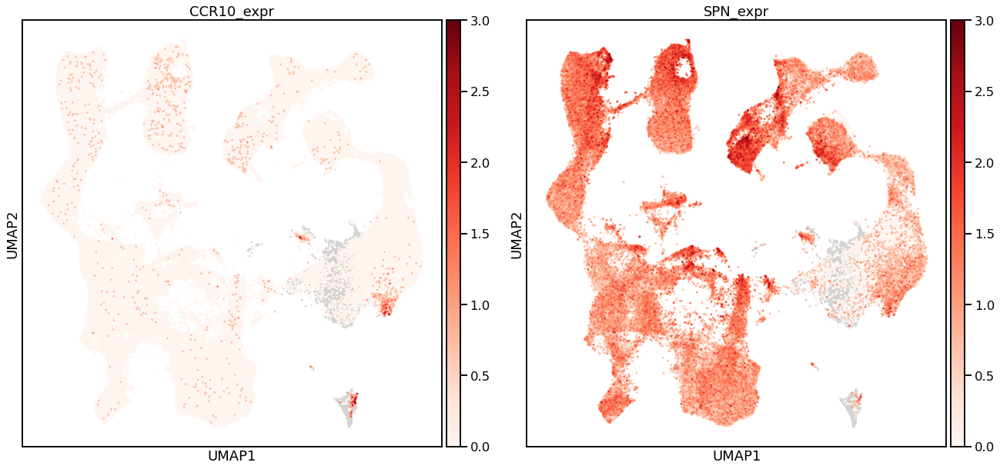

In [181]:
sc.pl.umap(merged_adata_bcells, color=["CCR10_expr", "SPN_expr"], size=30, vmax=3, cmap="Reds")

In [885]:
sc.pp.normalize_per_cell(query_adata_full, counts_per_cell_after=10e4)
sc.pp.log1p(query_adata_full)

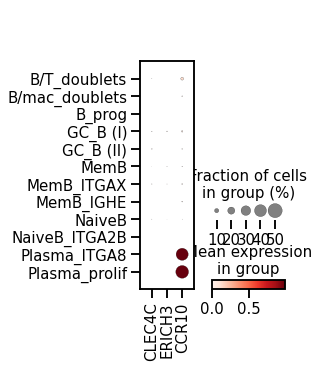

In [886]:
sc.pl.dotplot(query_adata_full, ['CLEC4C', "ERICH3", "CCR10"], groupby="anno_B_v2")

In [883]:
query_adata_full.obsm["X_scvi_int"] = merged_adata_bcells[query_adata_full.obs_names + "-query"].obsm["X_scvi"].copy()
query_adata_full.obsm["X_umap_int"] = merged_adata_bcells[query_adata_full.obs_names + "-query"].obsm["X_umap"].copy()

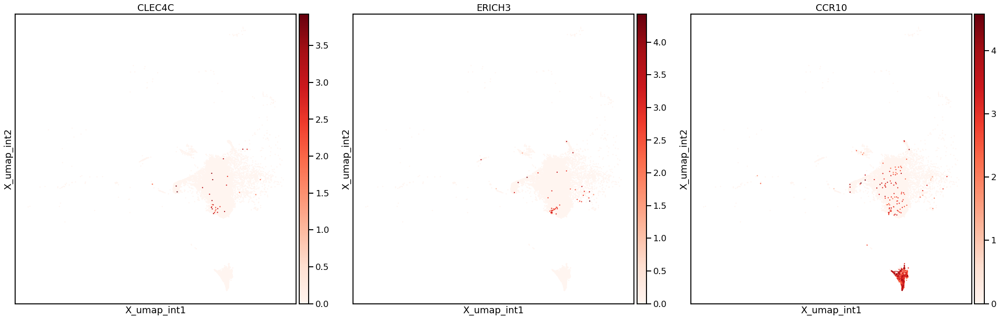

In [892]:
sns.set_context("talk")
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.embedding(query_adata_full, "X_umap_int", color=['CLEC4C', "ERICH3", "CCR10"], size=20, cmap="Reds")

### Organ distribution

In [80]:
reference_obs = merged_adata_bcells.obs_names[merged_adata_bcells.obs['dataset'] == "reference"]
merged_adata_bcells.obs["reference_organ"] = np.nan
merged_adata_bcells.obs.loc[reference_obs[reference_obs.str.strip("-reference").isin(anno_obs.index)],"reference_organ"] = anno_obs["organ"][reference_obs.str.strip("-reference")[reference_obs.str.strip("-reference").isin(anno_obs.index)]].values

... storing 'reference_organ' as categorical


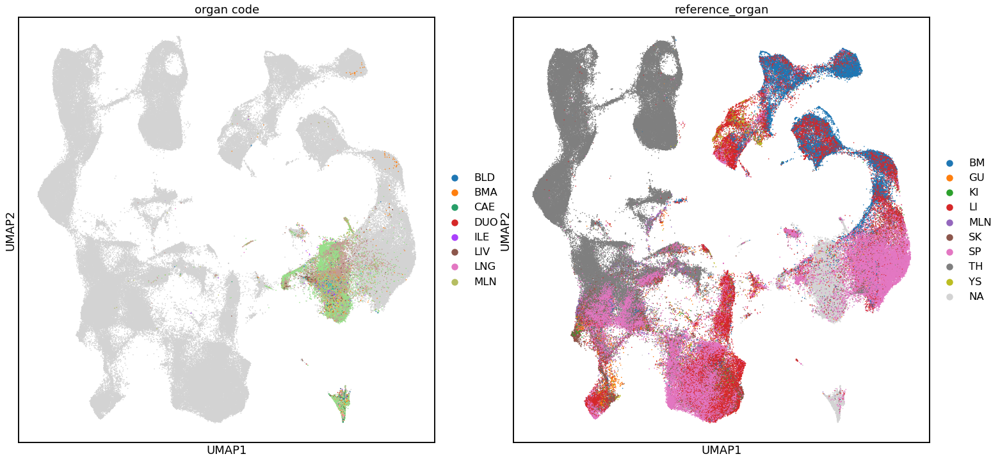

In [70]:
sc.pl.umap(merged_adata_bcells, color=["organ code", "reference_organ"], size=10)

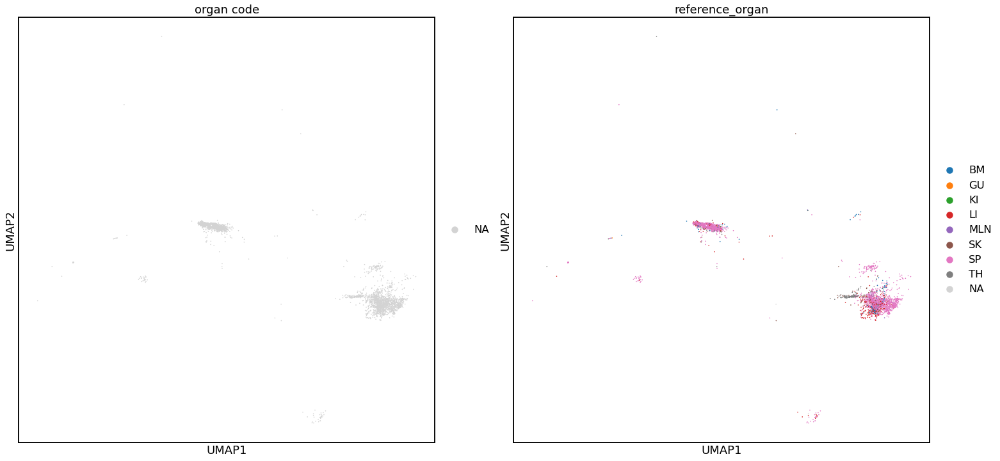

In [71]:
sc.pl.umap(merged_adata_bcells[merged_adata_bcells.obs["annotation_reference"] == "CYCLING_B/B1"], color=["organ code", "reference_organ"], size=10)

In [72]:
X_emb = merged_adata_bcells.obsm["X_scvi"].copy()

In [73]:
is_query = merged_adata_bcells.obs["dataset"] == "query"
is_reference = merged_adata_bcells.obs["dataset"] == "reference"

In [74]:
is_reference_anno = merged_adata_bcells.obs["annotation_reference"] == "CYCLING_B/B1"
dmat = scipy.spatial.distance_matrix(X_emb[is_query,:], X_emb[is_reference_anno,:])

In [80]:
merged_adata_bcells.obs[is_reference_anno].value_counts('reference_organ')

reference_organ
SP     2022
LI      358
TH      200
BM      125
SK       83
MLN      66
GU       12
KI        6
YS        0
dtype: int64

### Query-reference distance

In [445]:
import time

start = time.time()
mnn_query, mnn_ref = _find_MNNs(merged_adata_bcells)
end = time.time()
print(end - start)

17.48931884765625


In [446]:
_MNN_to_KNN_similarity_ratio(merged_adata_bcells, mnn_ref, mnn_query)

241950


In [447]:
plt.rcParams["figure.figsize"] = [10,10]
sns.set_context("talk")
sc.pl.umap(merged_adata_bcells, color="mnn_sim_ratio", size=10, title="MNN/KNN similarity")

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'bbk' as categorical
... storing 'GeneID' as categorical
... storing 'GeneName' as categorical
... storing 'gene_ids' as categorical
... storing 'feature_types' as categorical
... storing 'gene_names' as categorical


KeyError: "Could not find entry in `obsm` for 'umap'.\nAvailable keys are: ['X_scvi']."

In [451]:
merged_adata_bcells.obs

Index(['file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'bbk',
       '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean',
       '_scvi_local_l_var', 'dataset', 'knn_sim', 'mnn_sim', 'mnn_sim_ratio'],
      dtype='object')

In [449]:
_plot_sorted_violin(merged_adata_bcells, "anno_B_v2","mnn_sim_ratio")
_plot_sorted_violin(merged_adata_bcells, "annotation_reference","mnn_sim_ratio")

KeyError: "['anno_B_v2'] not in index"

Trying to set attribute `.uns` of view, copying.


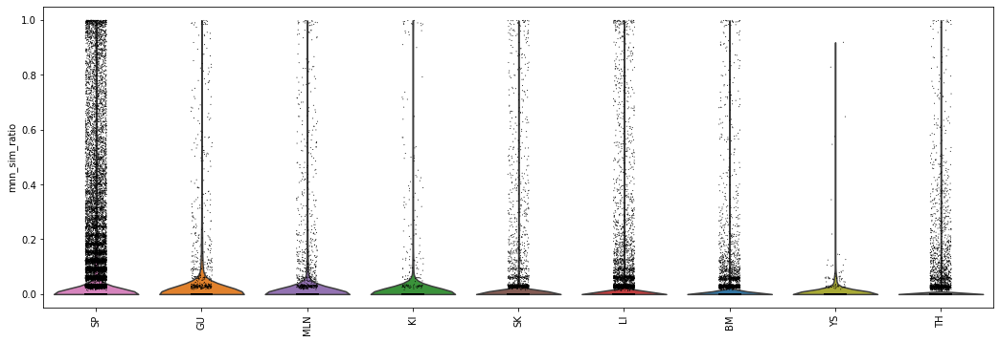

In [469]:
_plot_sorted_violin(merged_adata_bcells, "reference_organ","mnn_sim_ratio")


In [470]:
merged_adata_bcells.obs["reference_age"] = np.nan
merged_adata_bcells.obs.loc[reference_obs[reference_obs.str.strip("-reference").isin(anno_obs.index)],"reference_age"] = anno_obs["age"][reference_obs.str.strip("-reference")[reference_obs.str.strip("-reference").isin(anno_obs.index)]].values

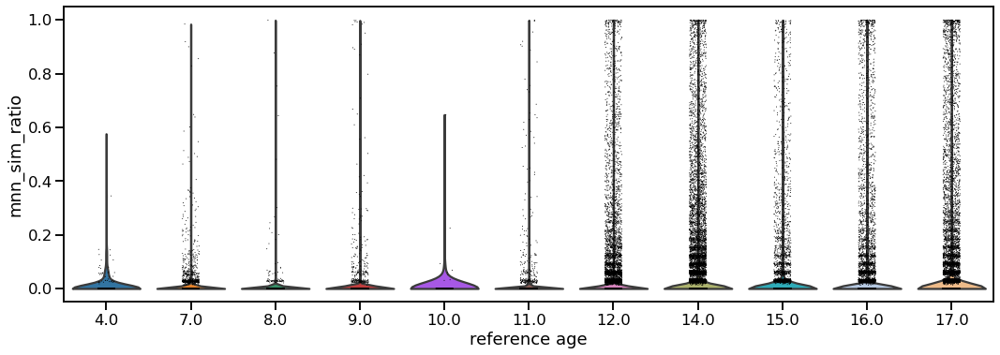

In [677]:
merged_adata_bcells.obs['reference_age'] = merged_adata_bcells.obs['reference_age'].astype("category")
sc.pl.violin(merged_adata_bcells[merged_adata_bcells.obs["mnn_sim_ratio"] > 0], "mnn_sim_ratio", groupby="reference_age")


In [ ]:
sc.pl.violin(merged_adata_bcells[merged_adata_bcells.obs["mnn_sim_ratio"] > 0], "mnn_sim_ratio", groupby="reference_age")

In [681]:
df = merged_adata_bcells.obs[["mnn_sim_ratio", "reference_age", "reference_organ"]].dropna()
df.reference_age = df.reference_age.astype('str')

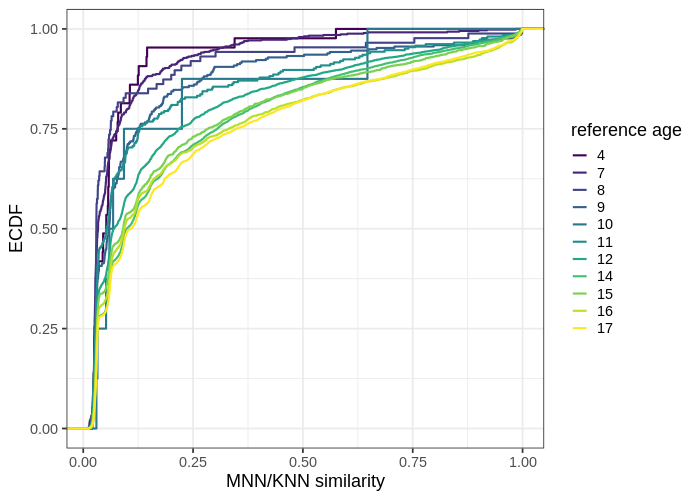

In [695]:
%%R -i df -w 700 -h 500
df %>%
#     mutate(reference_age=factor(reference_age, levels=as.character(sort(unique(as.integer(reference_age)))))) %>%
    filter(mnn_sim_ratio > 0) %>%
    mutate(is_shared=mnn_sim_ratio > 0.5) %>%
    ggplot(aes(color=as.factor(as.numeric(reference_age)), mnn_sim_ratio)) +
    stat_ecdf(size=1) +
#     ggplot(aes(mnn_sim_ratio, color=as.factor(as.numeric(reference_age)))) +
#     stat_ecdf() +
    scale_color_viridis_d(name="reference age") +
    theme_bw(base_size=18) +
    ylab("ECDF") +
    xlab("MNN/KNN similarity") 
#     ylim(0.75,1)

`summarise()` has grouped output by 'reference_organ'. You can override using the `.groups` argument.


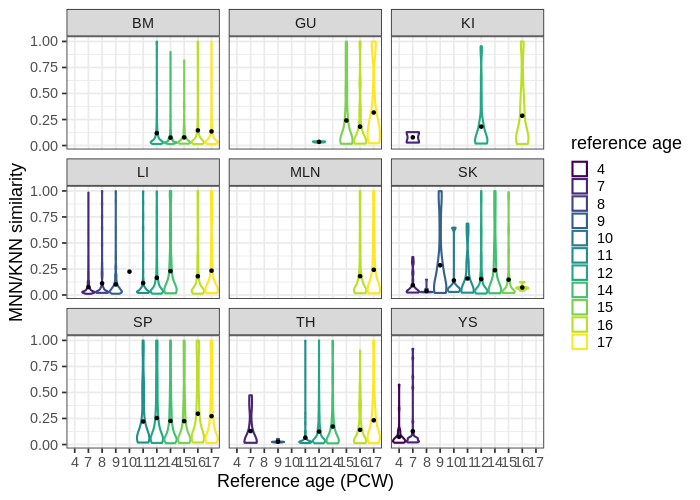

In [694]:
%%R -i df -w 700 -h 500
df %>%
#     mutate(reference_age=factor(reference_age, levels=as.character(sort(unique(as.integer(reference_age)))))) %>%
    filter(mnn_sim_ratio > 0) %>%
    mutate(is_shared=mnn_sim_ratio > 0.5) %>%
    ggplot(aes(as.factor(as.numeric(reference_age)), mnn_sim_ratio, color=as.factor(as.numeric(reference_age)))) +
    geom_violin(size=1, scale="width") +
    geom_point(data=. %>% group_by(reference_organ, reference_age) %>% summarise(mnn_sim_ratio = mean(mnn_sim_ratio), n=n()), 
               aes(x=as.factor(as.numeric(reference_age))),
               color="black") +
#     stat_density(size=1) +
#     ggplot(aes(mnn_sim_ratio, color=as.factor(as.numeric(reference_age)))) +
#     stat_ecdf() +
    scale_color_viridis_d(name="reference age") +
    theme_bw(base_size=18) +
    ylab("MNN/KNN similarity") + xlab("Reference age (PCW)") +
    facet_wrap(reference_organ~.)
#     ylim(0.75,1)

---

In [623]:
adj_mnn_dists_query

array([[0.65962392, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.80448868, 0.72602913, 0.70981102, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.7963387 , 0.79084304, 0.7640081 , ..., 0.        , 0.        ,
        0.        ],
       [0.81409113, 0.78381307, 0.77502271, ..., 0.81962548, 0.771223  ,
        0.77473248],
       [0.77175582, 0.78013514, 0.8121301 , ..., 0.        , 0.        ,
        0.        ]])

In [627]:
annos = merged_adata_bcells.obs["annotation_reference"].dropna().copy()

dummy_df = pd.get_dummies(annos)
dummy_mat = scipy.sparse.csr_matrix(dummy_df)

In [635]:
mnn_sim = mnn_dists.copy()
mnn_dists_nz = mnn_dists.nonzero()
for i in range(mnn_sim.shape[0]):
    if any(mnn_dists_nz[0]==i):
        dist_nns = np.array(mnn_sim[(mnn_dists_nz[0][mnn_dists_nz[0]==i], mnn_dists_nz[1][mnn_dists_nz[0]==i])]).ravel()
        adj_dist_nns = _scArches_adjusted_dist(dist_nns)
        mnn_sim[(mnn_dists_nz[0][mnn_dists_nz[0]==i], mnn_dists_nz[1][mnn_dists_nz[0]==i])] = adj_dist_nns


In [636]:
mnn_sim[mnn_sim.nonzero()].max()

0.9336583530979079

In [637]:
new_anno = mnn_sim.dot(dummy_mat).toarray()

In [644]:
new_anno_prob = new_anno.T/new_anno.sum(1)
new_anno_prob[np.isnan(new_anno_prob)] = 0


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


In [648]:
best_label = dummy_df.columns[new_anno_prob.argmax(0)].values
best_label_score = new_anno_prob.max(0)


In [657]:
df = pd.DataFrame(zip(best_label, merged_adata_bcells[is_query].obs["anno_B_v2"]))
df.columns = ['new', 'old']

In [658]:
conf_mat = sc.metrics.confusion_matrix("new",'old',  df, normalize=True)

<AxesSubplot:xlabel='old', ylabel='new'>

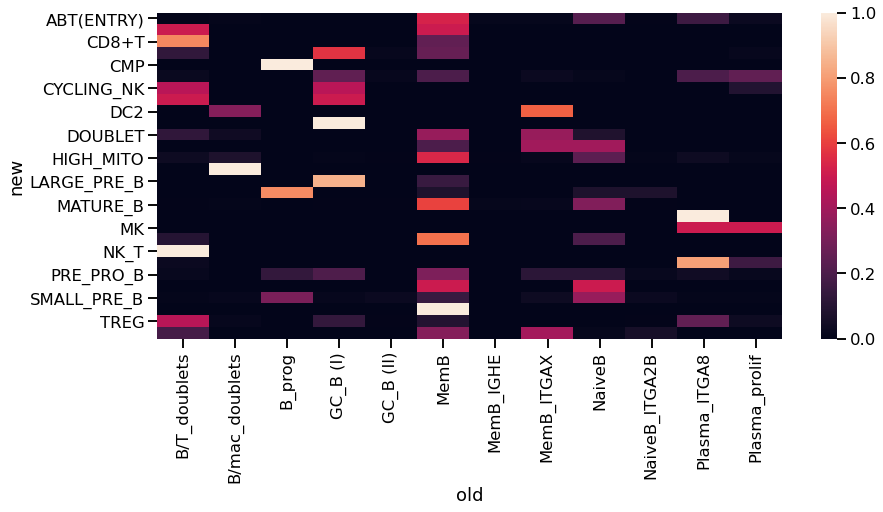

In [660]:
sns.heatmap(conf_mat)

---

---
## Junk and snippets

In [29]:
data_dir = "/nfs/team205/ed6/data/Fetal_immune/"
merged_adata_bcells = sc.read_h5ad(data_dir + 'panimmune_Bcells_query.mapped2LYMPHOID.withReference.h5ad')

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


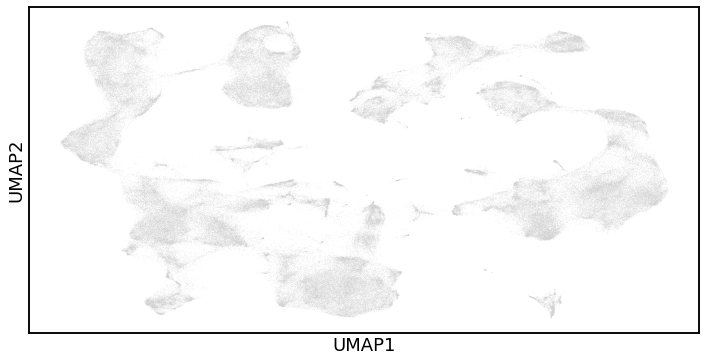

In [845]:
sc.pl.umap(merged_adata_bcells)

In [13]:
merged_adata_pedgut = sc.read_h5ad(ref_data_dir + 'HSC_IMMUNE_with_pedGut.h5ad')

In [38]:
## Load reference annotations
anno_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv", index_col=0)

reference_obs = merged_adata_pedgut.obs_names[merged_adata_pedgut.obs.dataset == "reference"]
merged_adata_pedgut.obs["annotation_reference"] = np.nan
merged_adata_pedgut.obs.loc[reference_obs[reference_obs.str.strip("-reference").isin(anno_obs.index)], "annotation_reference"]= anno_obs.loc[reference_obs.str.strip("-reference")[reference_obs.str.strip("-reference").isin(anno_obs.index)]]["anno_lvl_2_final_clean"].values

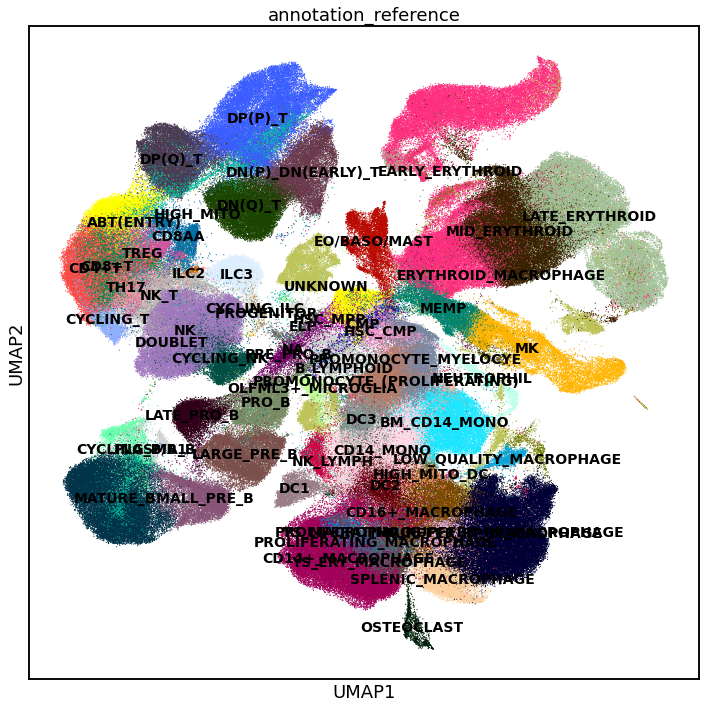

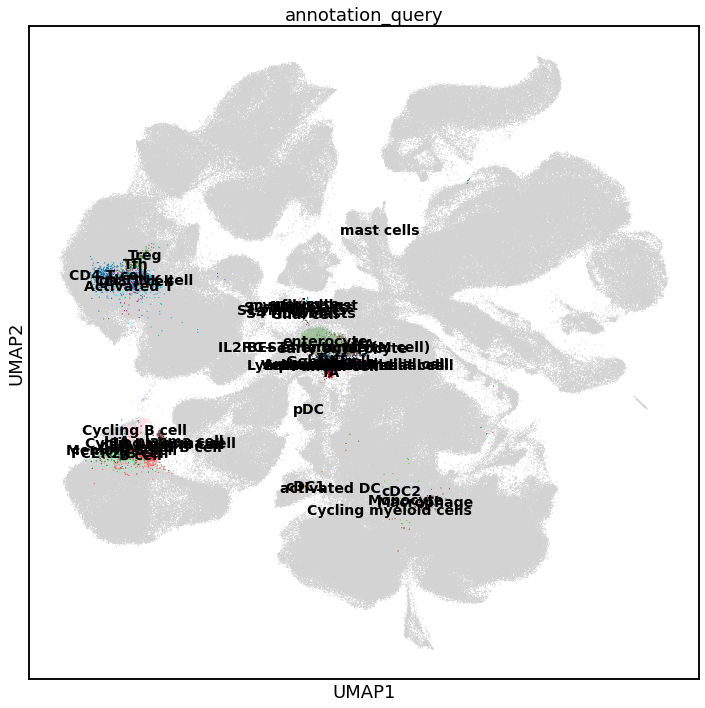

In [48]:
plt.rcParams["figure.figsize"] = [12,12]
sns.set_context("talk")

ref_annos = merged_adata_pedgut.obs["annotation_reference"].dropna().unique().tolist()
query_annos = merged_adata_pedgut.obs["annotation_V2"].dropna().unique().tolist()

sc.pl.umap(merged_adata_pedgut, color="annotation_reference", 
           groups=[x for x in ref_annos if x!='nan'], 
           legend_loc="on data", size=5, legend_fontsize=14)
sc.pl.umap(merged_adata_pedgut, color="annotation_V2", 
           groups=[x for x in query_annos if x!='nan'], 
           legend_loc="on data", size=5, legend_fontsize=14, title="annotation_query")